# Effect of the same fault injected at different bits

In [21]:
%matplotlib inline

In [22]:
# For plotting
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import LogNorm
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

# For parsing Matrix files
import scipy.io

import numpy as np

## Import modules

In [23]:
from Experiment import *
from Parameters import *
from Fault import *
from Algorithm import *

## Define inputs

In [24]:
inputs = []

#### Matrice HB/arc130 (https://www.cise.ufl.edu/research/sparse/matrices/HB/arc130.html)

239734.79553
3.95980213558e-06


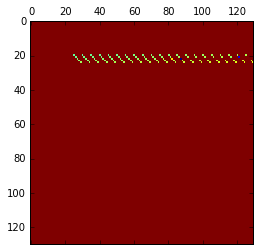

In [25]:
if True:
    A = scipy.io.loadmat('./arc130.mat')['Problem'][0][0][1].toarray()
    n = A.shape[0]
    plt.matshow(A)
    u, s, v = np.linalg.svd(A)
    print s[0]
    print s[-1]
    x = np.ones((n, 1))
    b = A.dot(x)
    x = np.zeros((n, 1))

#### Matrice gre_216a

1.01116601557
0.00981568462302


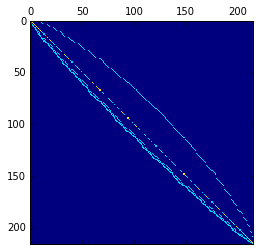

In [26]:
if True:
    A = scipy.io.loadmat('./gre_216a.mat')['Problem'][0][0][1].toarray()
    n = A.shape[0]
    plt.matshow(A)
    u, s, v = np.linalg.svd(A)
    print s[0]
    print s[-1]
    x = np.ones((n, 1))
    b = A.dot(x)
    x = np.zeros((n, 1))
   

In [27]:
inputs += [{"A": A, "b": b, "x0": x}]

## Define the algorithm

In [28]:
import gmres

#### Algorithm parameters

In [29]:
# parameters that won't change during the whole experiment
algorithm_parameters = Parameters()
algorithm_parameters["m"] = n
algorithm_parameters["tol"] = 1.e-12
algorithm_parameters["iterMax"] = n
algorithm_parameters["orthMethod"] = gmres.modified_gramschmidt
algorithm_parameters["dtype"] = 'd'
algorithm_parameters["vulnerable"] = True
algorithm_parameters["save_data"] = {"iteration_count",
                                     "residual",
                                     "residuals",
                                     "true_residual",
                                     "true_residuals",
                                     "orthogonality",
                                     "arnoldi",
                                     "faults",
                                     "H",
                                     "V"}

#### Implementation (gmres)

In [30]:
def implementation(self, input, algorithm_parameters, experiment_parameters):
    gmres.pipelined_p1(self, input, algorithm_parameters, experiment_parameters)

In [31]:
gmres_algorithm = Algorithm(algorithm_parameters, implementation)

## Run the experiment

### Define the experiment parameters

In [32]:
from sys import stdout

experiment_parameters_without_fault = Parameters()
experiment_parameters_without_fault["vulnerable"] = False

orthMethods = []
orthMethods += [gmres.classical_gramschmidt]
#orthMethods += [lambda w, V, H, i: gmres.classical_gramschmidt(w, V, H, i, True)]
orthMethods += [gmres.modified_gramschmidt]
#orthMethods += [lambda w, V, H, i: gmres.modified_gramschmidt(w, V, H, i, True)]
  


def experiment_parameters_generator():
    parameters = Parameters()
    parameters["vulnerable"] = True
    fault_parameters = {}
    fault_parameters["fault_callback"] = lambda fault: (stdout.write(" %s " % str(fault)))
    fault_parameters["register"] = "left"
    fault_parameters["vulnerable"] = True
    while (True):
        fault_parameters["vulnerable_bits"] = [int(np.random.rand() * 64)]
        fault_parameters["fault_indices"] = {"i": int(np.random.rand()*n), 
                                             "j":0, 
                                             "k":int(np.random.rand()*n)}
        fault_parameters["timer"] = int(np.random.rand() * 150)
        
        parameters["fault_parameters"] = fault_parameters
        
        for orthMethod in orthMethods:
            parameters["orthMethod"] = orthMethod
            yield parameters

#experiment_parameters = experiment_parameters_generator()
#experiment_parameters["fault_parameters"] = fault_parameters

### Setup the experiment (algorithm, parameters and inputs)

In [33]:
# Experiment without fault
experiment_parameters_without_fault["orthMethod"]
F = Experiment(experiment_parameters_without_fault, gmres_algorithm)
F.set_inputs(inputs)

for orthMethod in orthMethods:
    experiment_parameters_without_fault["orthMethod"] = orthMethod
    F.run(show_progress=False, n=1)

print F.get_data("faults")

[[], []]


In [34]:
print F.get_data('faults')

[[], []]


In [35]:
# Experiment with fault
E = Experiment(experiment_parameters_generator(), gmres_algorithm)
E.set_inputs(inputs)
E.run(show_progress=True, n=len(orthMethods) * 10)

Complete ! 


## Display the experiment result

In [36]:
E.get_results()[0]

({'A': array([[ 0.75,  0.  ,  0.  , ...,  0.  ,  0.  ,  0.  ],
         [ 0.25,  0.5 ,  0.  , ...,  0.  ,  0.  ,  0.  ],
         [ 0.  ,  0.25,  0.5 , ...,  0.  ,  0.  ,  0.  ],
         ..., 
         [ 0.  ,  0.  ,  0.  , ...,  0.5 ,  0.  ,  0.  ],
         [ 0.  ,  0.  ,  0.  , ...,  0.25,  0.5 ,  0.  ],
         [ 0.  ,  0.  ,  0.  , ...,  0.  ,  0.25,  0.75]]),
  'b': array([[ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.25],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.  ],
         [ 1.25],
         [ 1.

## Display the experiment data

In [37]:
E.get_data()[0]

{'H': array([[  1.00359609e+00,  -2.54587310e-02,   2.04518400e-02, ...,
          -2.81462862e-03,   2.81462862e-03,  -1.47958737e-02],
        [  5.41835756e-02,   7.25541067e-01,   6.73945797e-03, ...,
          -2.61605764e-03,   2.61605764e-03,  -1.37520304e-02],
        [  0.00000000e+00,   2.91945497e-01,   4.84368733e-01, ...,
          -2.08922602e-03,   2.08922602e-03,  -1.09825943e-02],
        ..., 
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           5.00535922e+00,   2.51417320e-01,  -1.32164467e+00],
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   5.25677654e+00,   6.94759069e+00],
        [  0.00000000e+00,   0.00000000e+00,   0.00000000e+00, ...,
           0.00000000e+00,   0.00000000e+00,   6.41556313e+01]]),
 'V': array([[  6.78453532e-02,  -4.50280035e-03,   1.68326905e-03, ...,
           3.05403132e-02,  -3.05403132e-02,   1.60543602e-01],
        [  6.78453532e-02,  -4.50280035e-03,   1.6

## Plot convergence history

In [38]:
def plot_2D(X, Y, title = '', grid = True, label = "", log=False, linestyle = None, xlim = None, ylim = None):

    if log:
        p = plt.semilogy(X, Y[:len(X)], label=label)
    else:
        p = plt.plot(X, Y[:len(X)], label=label)
    if linestyle:
        plt.setp(p, linestyle=linestyle) 
    plt.title(title)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)
    if grid:
        plt.grid(True)


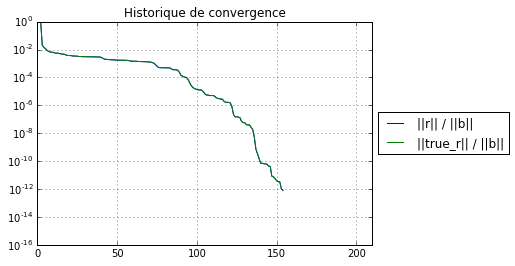

In [39]:
X = np.arange(2, F.get_data('iteration_count')[0]+1)
Y = F.get_data('residuals')[0]
Z = F.get_data('true_residuals')[0]

plot_2D(X, Y, log=True, title='Historique de convergence', label = "||r|| / ||b||", xlim=[0, 200], ylim=[1.e-16, 1.])
plot_2D(X, Z, log=True, title='Historique de convergence', label = "||true_r|| / ||b||", xlim=[0, 210], ylim=[1.e-16, 1.])

{'register_before': 0.25, 'loc': {'i': 115, 'k': 103, 'j': 0}, 'value_before': 0.0085587410669543083, 'register': 'left', 'timer': 41, 'register_after': 0.2500000596046448, 'bit': 30, 'value_after': 0.0085587404285760674, 'check': None}


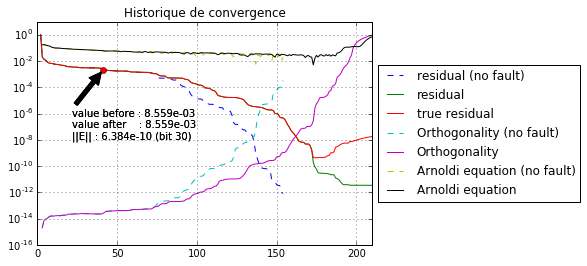

animation


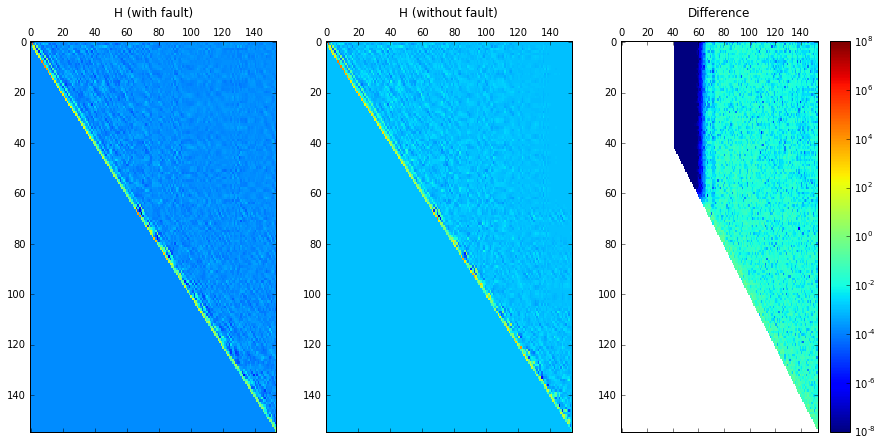

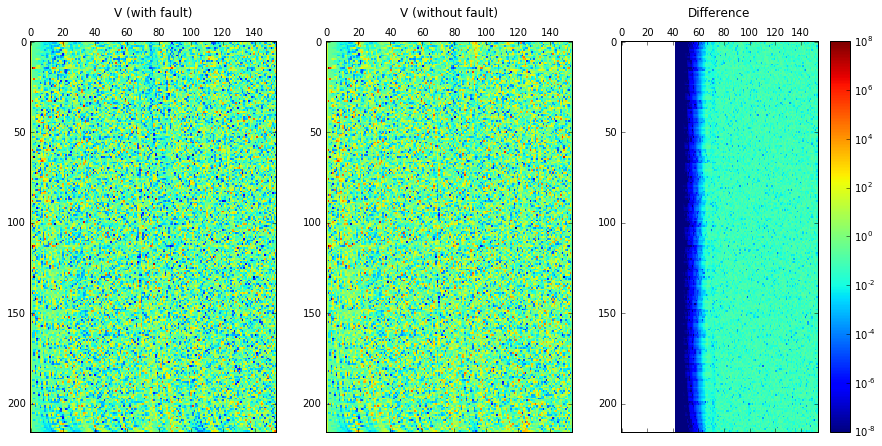

{'register_before': 0.25, 'loc': {'i': 115, 'k': 103, 'j': 0}, 'value_before': 0.0085587410659077098, 'register': 'left', 'timer': 41, 'register_after': 0.2500000596046448, 'bit': 30, 'value_after': 0.0085587404275294689, 'check': None}


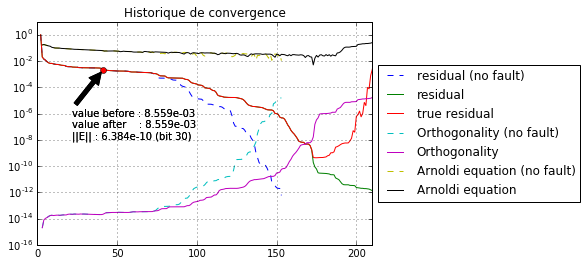

animation


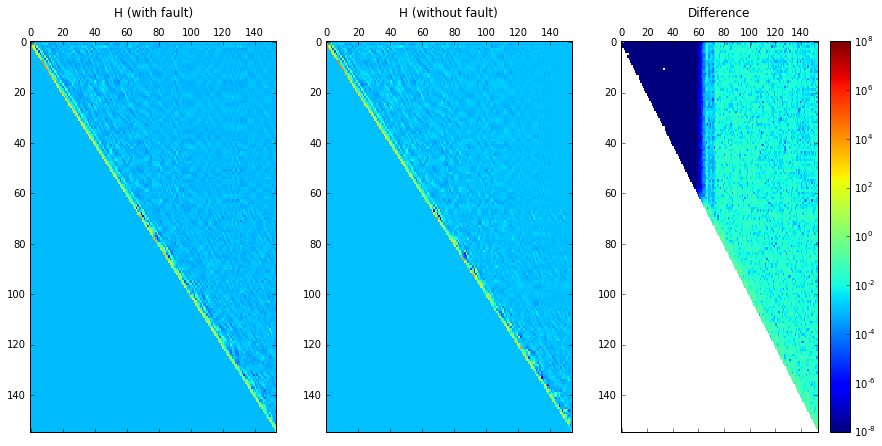

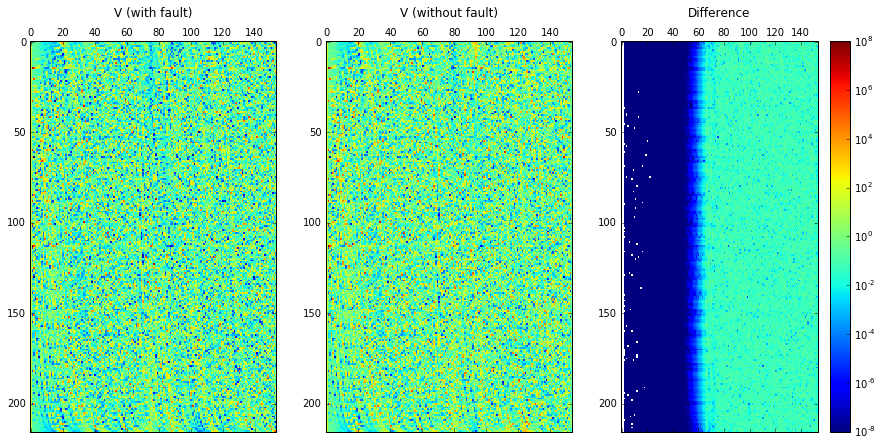

{'register_before': 0.25, 'loc': {'i': 43, 'k': 73, 'j': 0}, 'value_before': -0.0079456523961558782, 'register': 'left', 'timer': 82, 'register_after': 0.2500000000009095, 'bit': 14, 'value_after': -0.0079456523961861873, 'check': None}


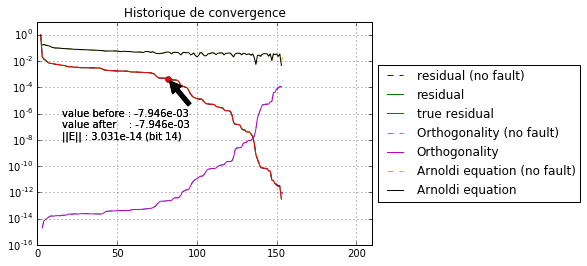

animation


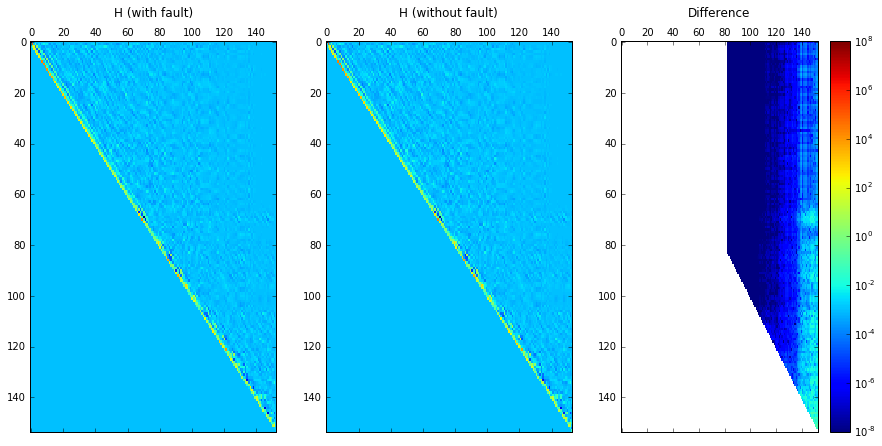

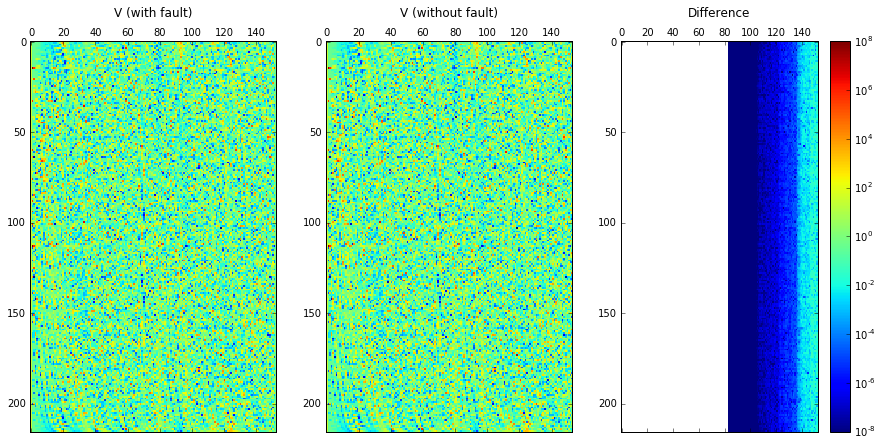

{'register_before': 0.25, 'loc': {'i': 43, 'k': 73, 'j': 0}, 'value_before': 0.028405750591043659, 'register': 'left', 'timer': 82, 'register_after': 0.2500000000009095, 'bit': 14, 'value_after': 0.028405750591075488, 'check': None}


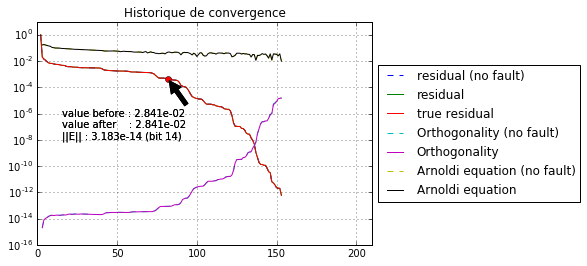

animation


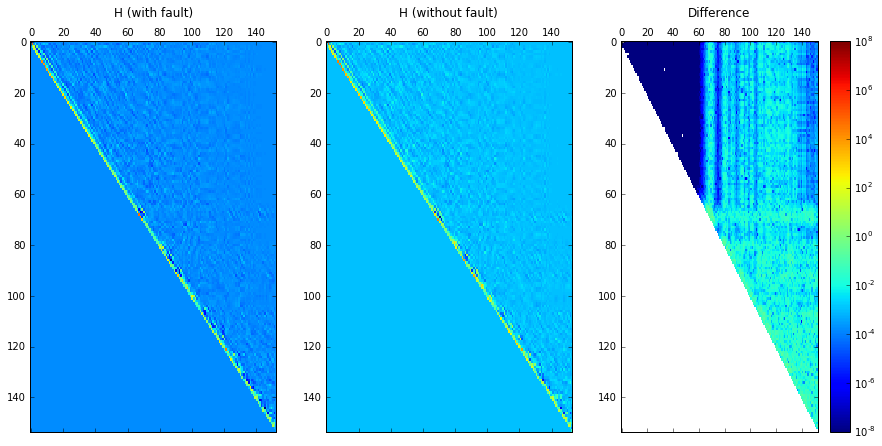

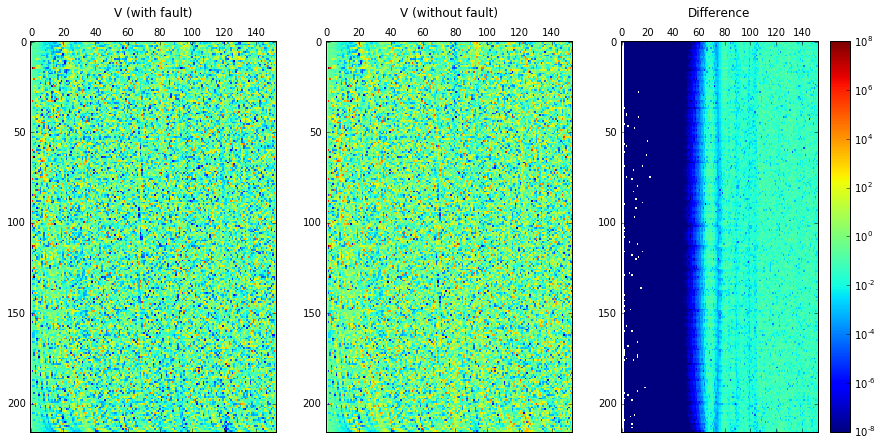

{'register_before': 0.25, 'loc': {'i': 175, 'k': 165, 'j': 0}, 'value_before': 0.0091760411236272814, 'register': 'left', 'timer': 67, 'register_after': 0.2500000000000018, 'bit': 5, 'value_after': 0.009176041123627323, 'check': True}


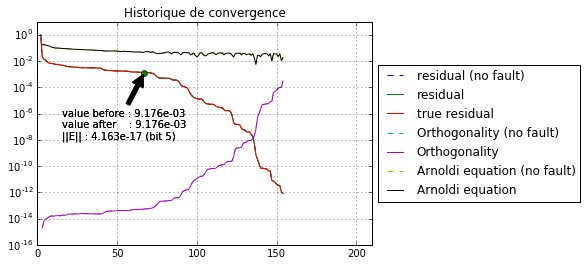

animation


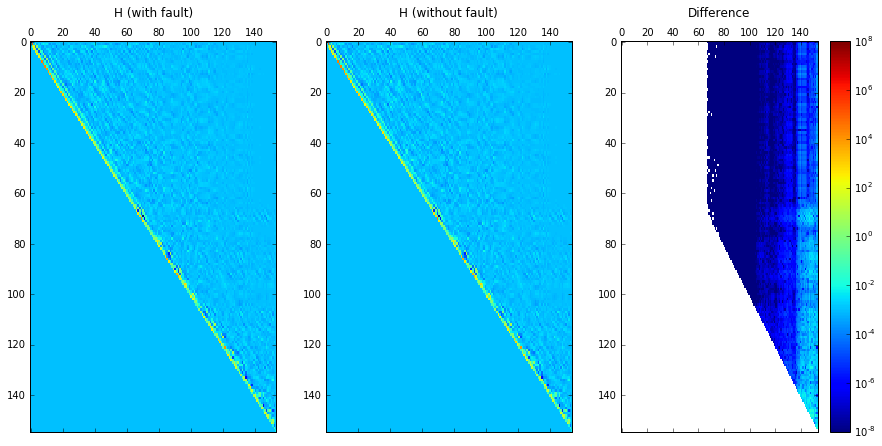

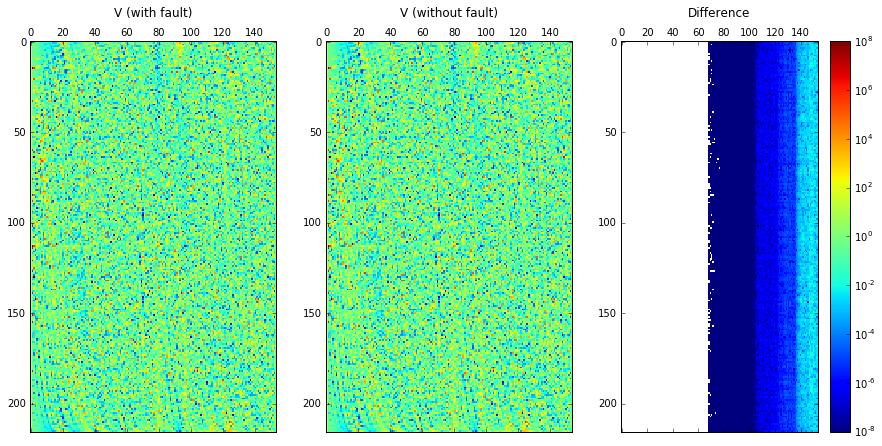

{'register_before': 0.25, 'loc': {'i': 175, 'k': 165, 'j': 0}, 'value_before': 0.0085509308560173854, 'register': 'left', 'timer': 67, 'register_after': 0.2500000000000018, 'bit': 5, 'value_after': 0.0085509308560174392, 'check': True}


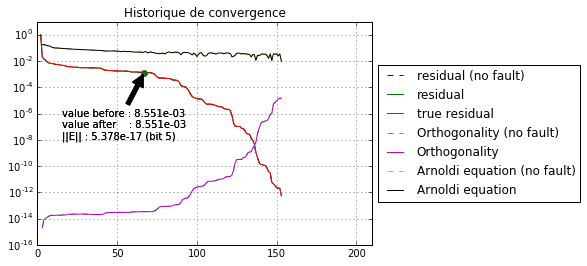

animation


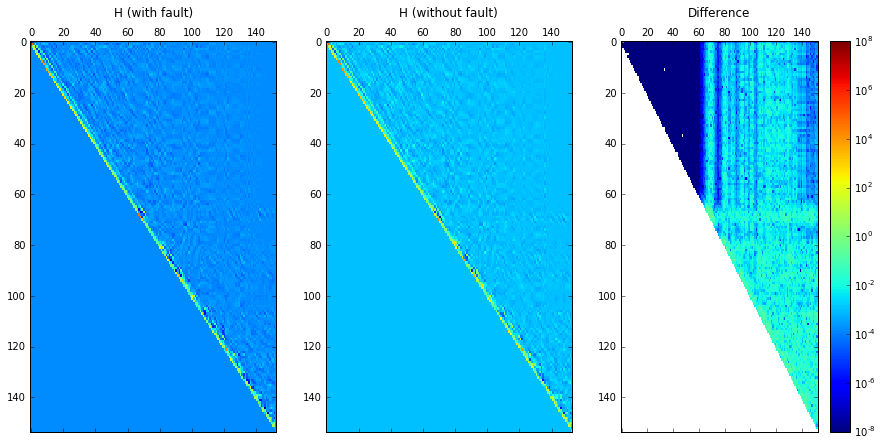

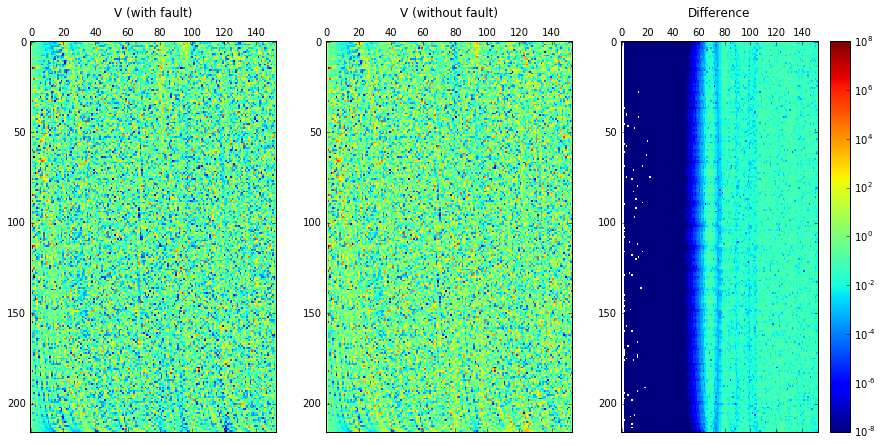

{'register_before': 0.25, 'loc': {'i': 196, 'k': 189, 'j': 0}, 'value_before': 0.0023055850476010934, 'register': 'left', 'timer': 148, 'register_after': 0.2500000000009095, 'bit': 14, 'value_after': 0.0023055850476025428, 'check': True}


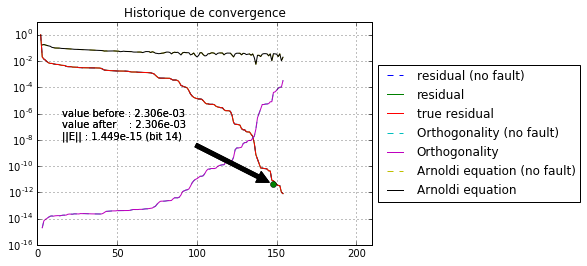

animation


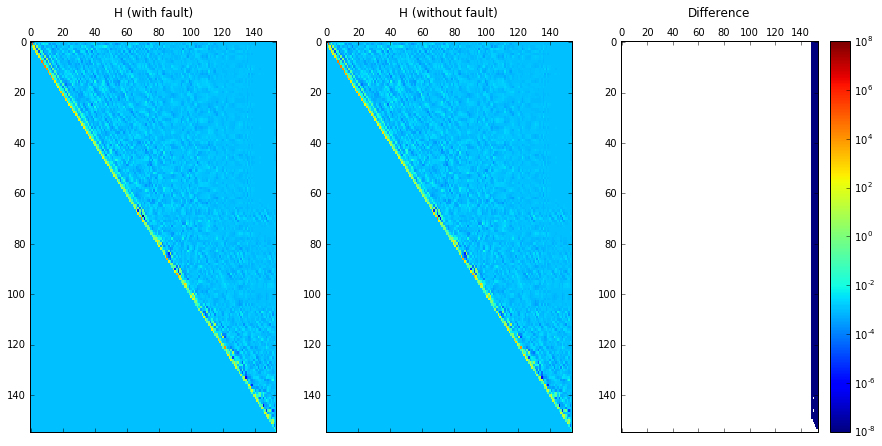

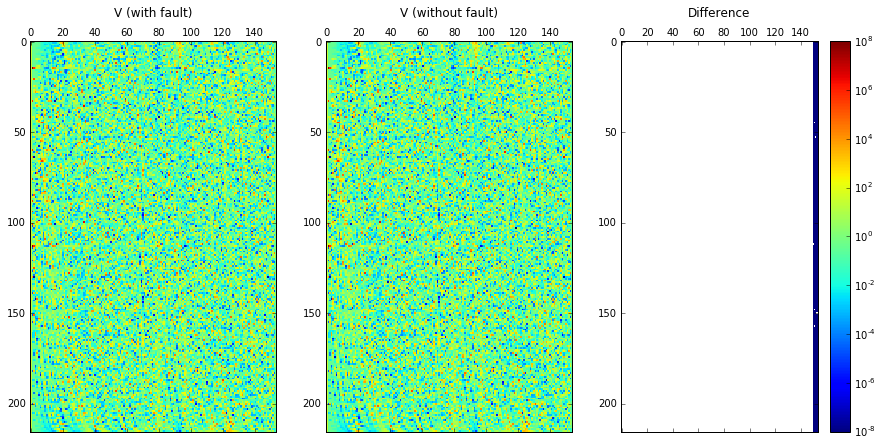

{'register_before': 0.25, 'loc': {'i': 196, 'k': 189, 'j': 0}, 'value_before': -0.0031840992924918004, 'register': 'left', 'timer': 148, 'register_after': 0.2500000000009095, 'bit': 14, 'value_after': -0.0031840992924846503, 'check': True}


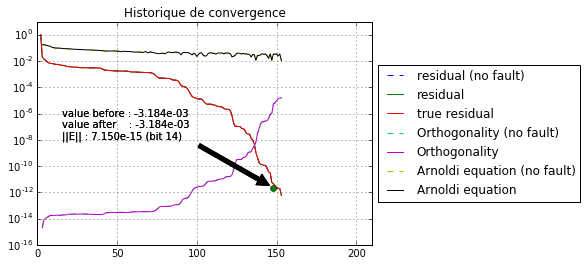

animation


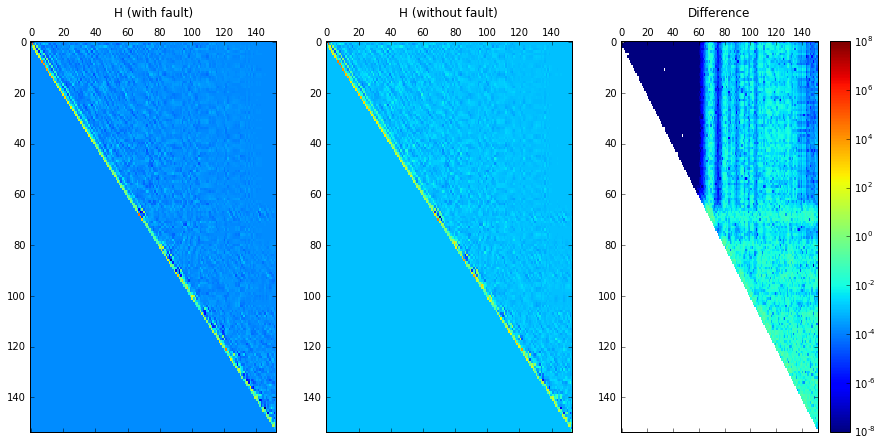

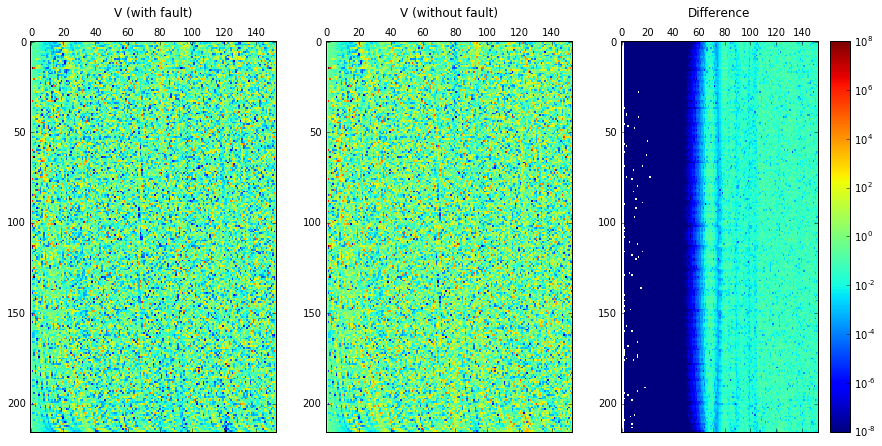

{'register_before': 0.25, 'loc': {'i': 187, 'k': 179, 'j': 0}, 'value_before': 0.0044662773077529501, 'register': 'left', 'timer': 142, 'register_after': 0.25000000000045475, 'bit': 13, 'value_after': 0.004466277307759549, 'check': True}


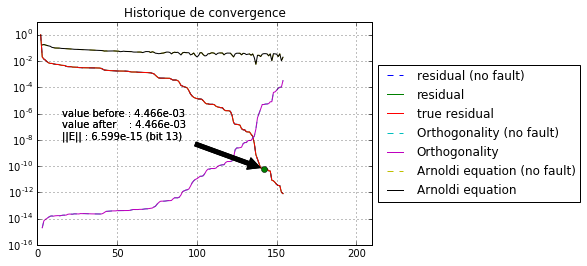

animation


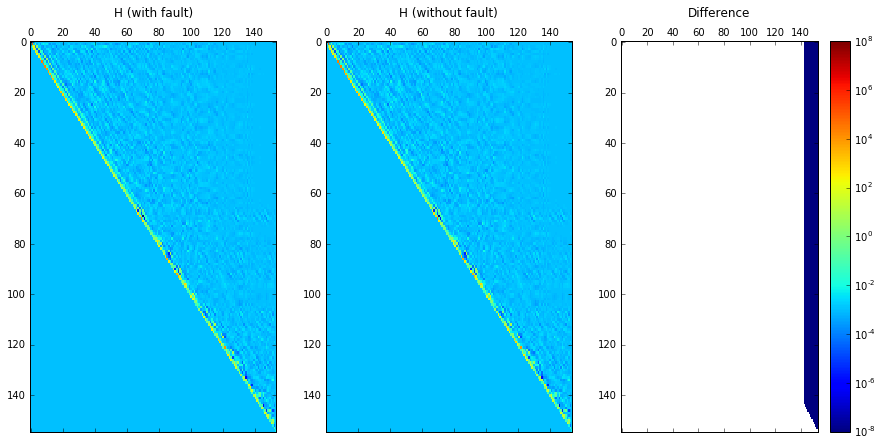

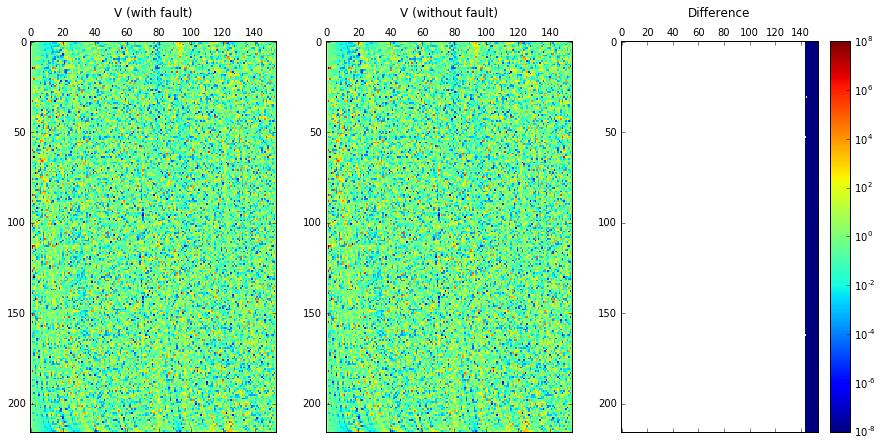

{'register_before': 0.25, 'loc': {'i': 187, 'k': 179, 'j': 0}, 'value_before': -0.0029774115792658364, 'register': 'left', 'timer': 142, 'register_after': 0.25000000000045475, 'bit': 13, 'value_after': -0.002977411579267346, 'check': True}


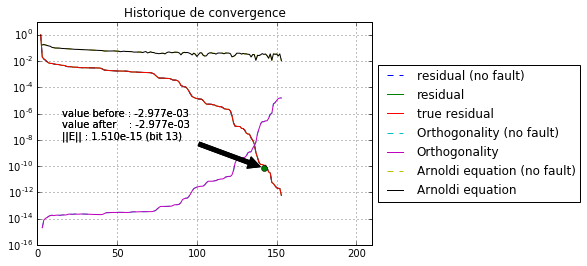

animation


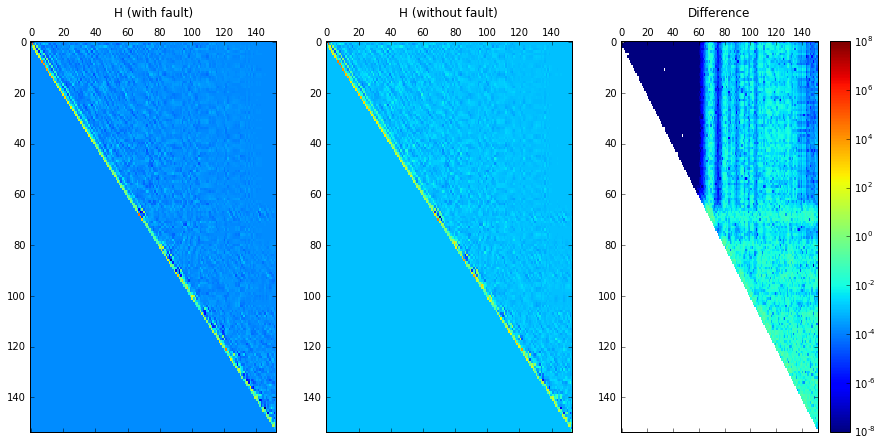

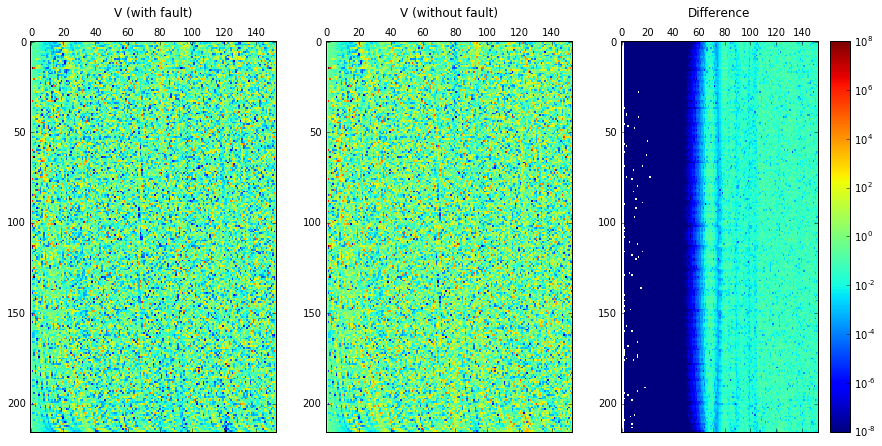

{'register_before': 0.25, 'loc': {'i': 8, 'k': 23, 'j': 0}, 'value_before': -6.0734726505697403e-05, 'register': 'left', 'timer': 136, 'register_after': 0.2578125, 'bit': 47, 'value_after': -1.4001294114525517e-05, 'check': None}


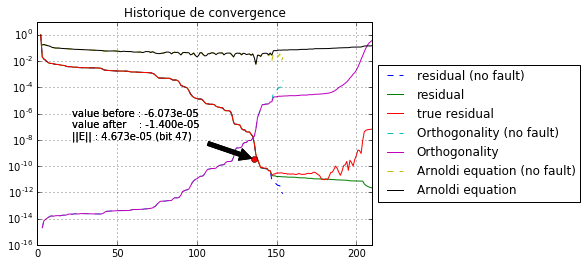

animation


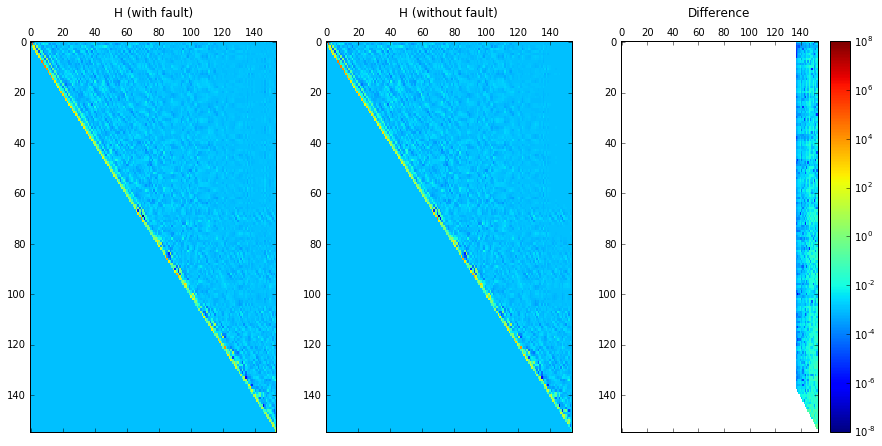

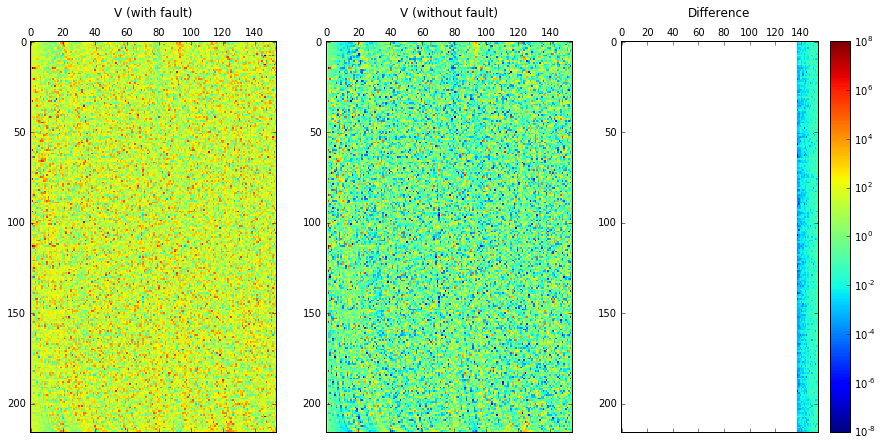

{'register_before': 0.25, 'loc': {'i': 8, 'k': 23, 'j': 0}, 'value_before': 0.00038230207655885837, 'register': 'left', 'timer': 136, 'register_after': 0.2578125, 'bit': 47, 'value_after': 0.00040797926534161212, 'check': None}


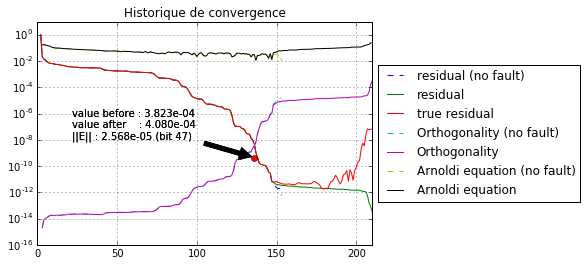

animation


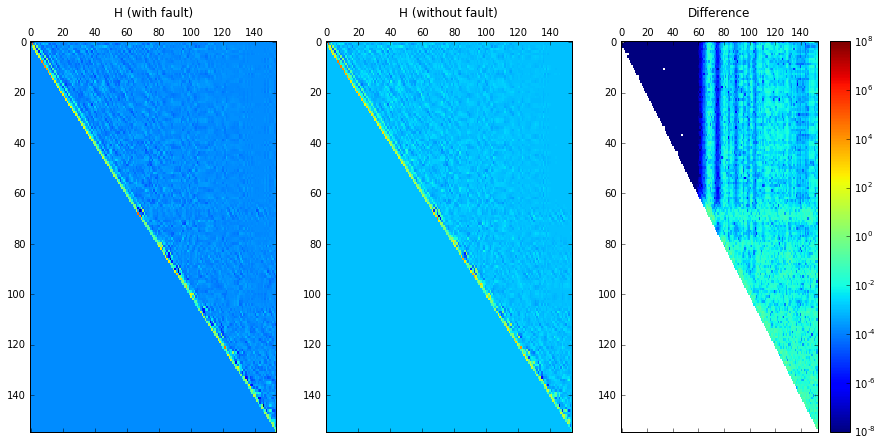

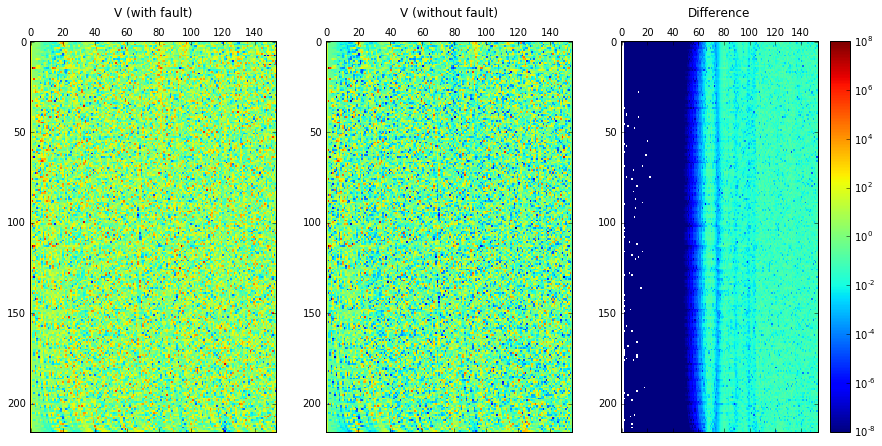

{'register_before': 0.25, 'loc': {'i': 100, 'k': 136, 'j': 0}, 'value_before': 0.0030781271137419568, 'register': 'left', 'timer': 92, 'register_after': 0.375, 'bit': 51, 'value_after': 0.0012489187198962927, 'check': None}


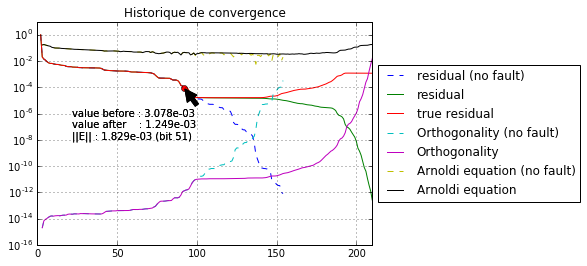

animation


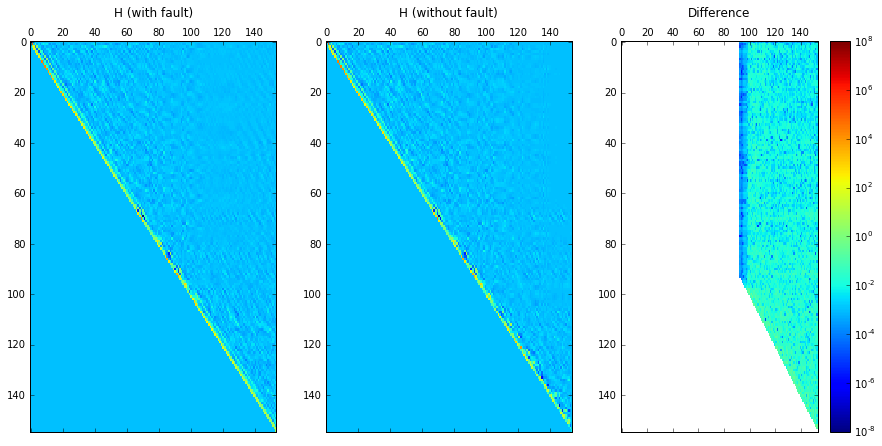

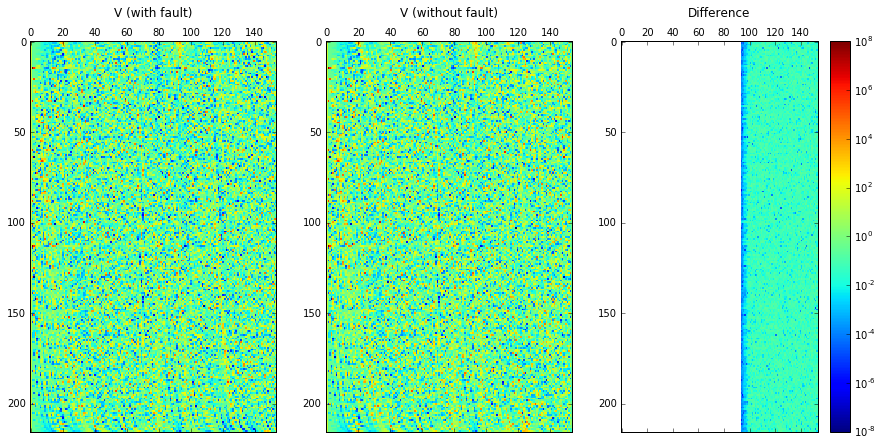

{'register_before': 0.25, 'loc': {'i': 100, 'k': 136, 'j': 0}, 'value_before': -0.0016760380698902615, 'register': 'left', 'timer': 92, 'register_after': 0.375, 'bit': 51, 'value_after': -0.0045269283681666963, 'check': None}


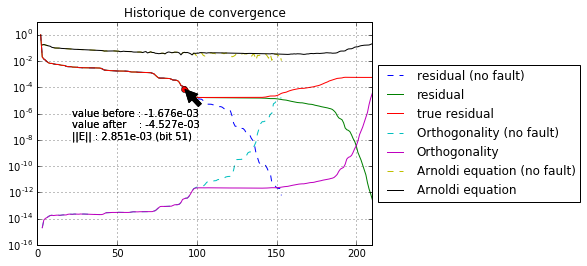

animation


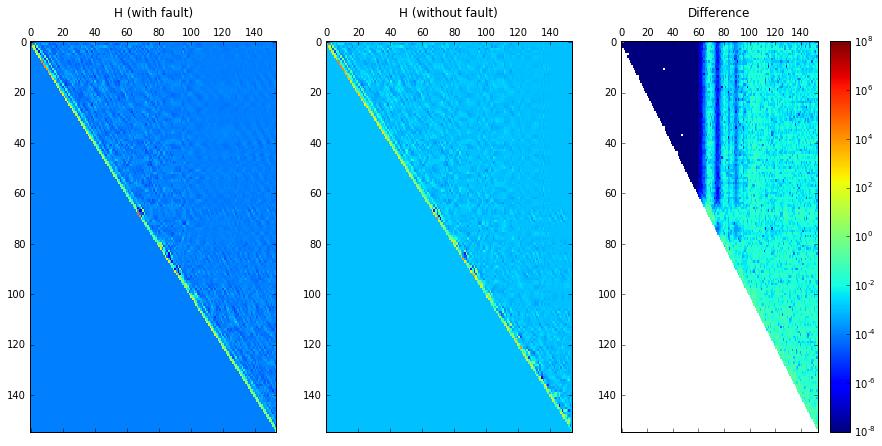

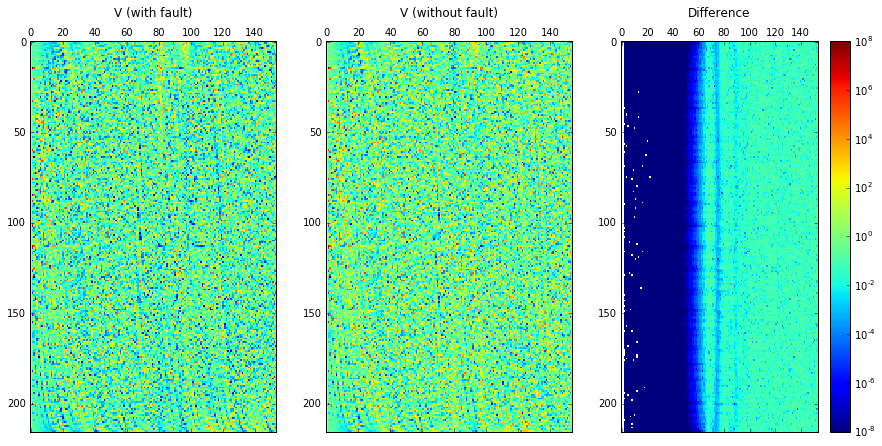

{'register_before': 0.25, 'loc': {'i': 40, 'k': 70, 'j': 0}, 'value_before': -0.0025701415830365216, 'register': 'left', 'timer': 48, 'register_after': 1.3552527156068805e-20, 'bit': 58, 'value_after': 0.0035870796313425104, 'check': None}


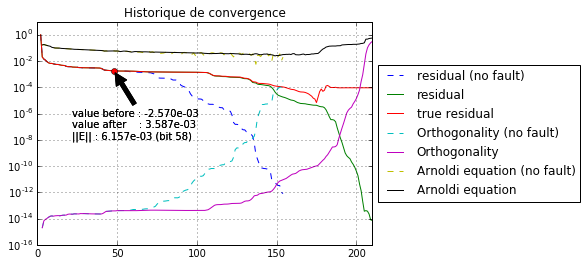

animation


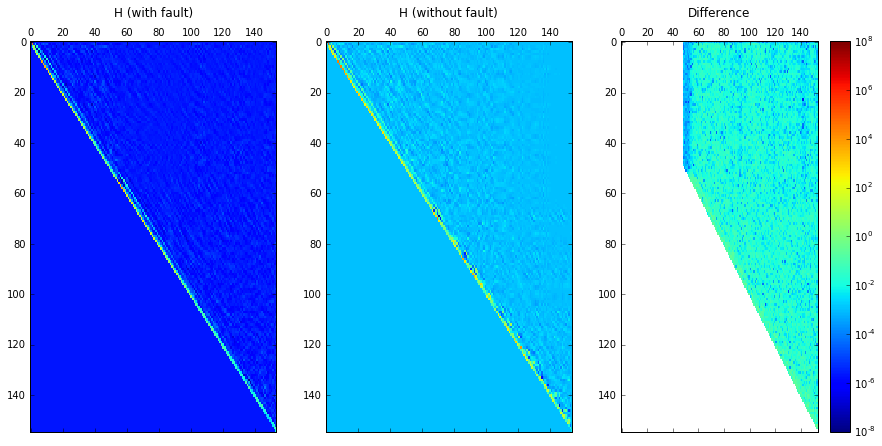

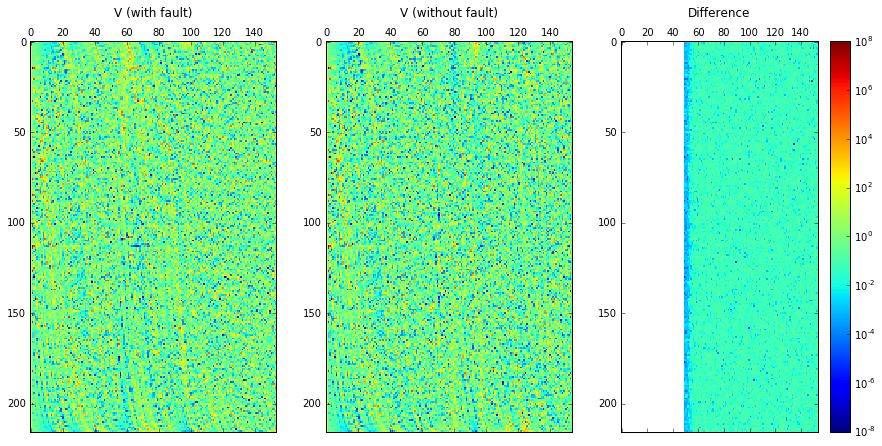

{'register_before': 0.25, 'loc': {'i': 40, 'k': 70, 'j': 0}, 'value_before': -0.0025701423758346647, 'register': 'left', 'timer': 48, 'register_after': 1.3552527156068805e-20, 'bit': 58, 'value_after': 0.0035870792166475167, 'check': None}


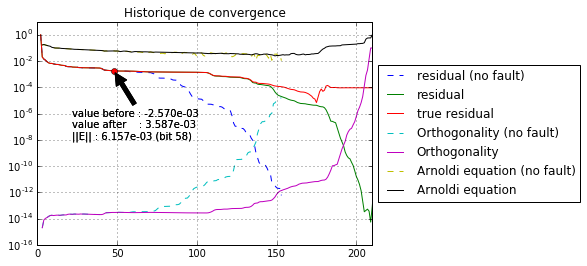

animation


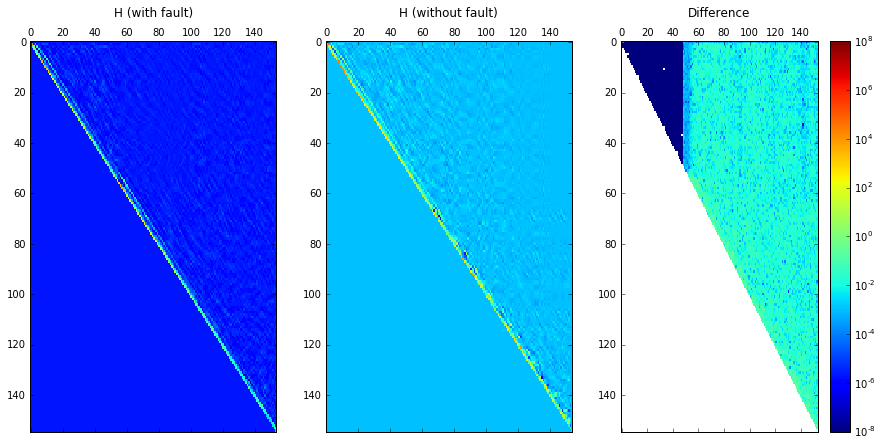

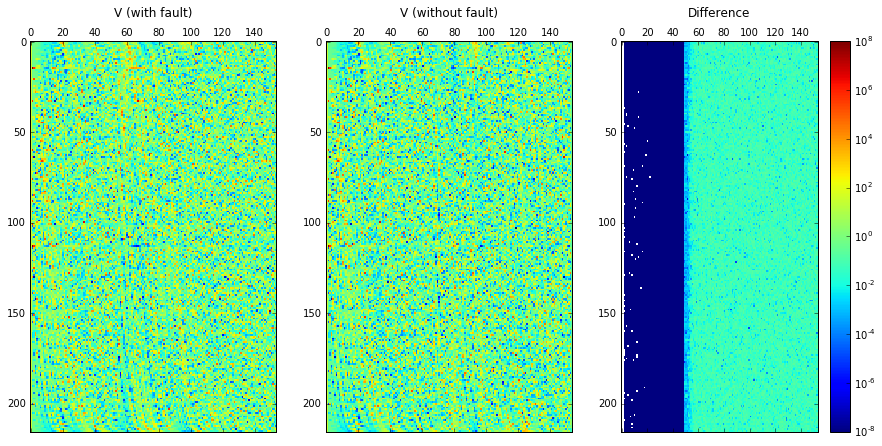

{'register_before': 0.25, 'loc': {'i': 86, 'k': 73, 'j': 0}, 'value_before': 0.0067303918240868565, 'register': 'left', 'timer': 63, 'register_after': 0.2500000000000009, 'bit': 4, 'value_after': 0.0067303918240868427, 'check': True}


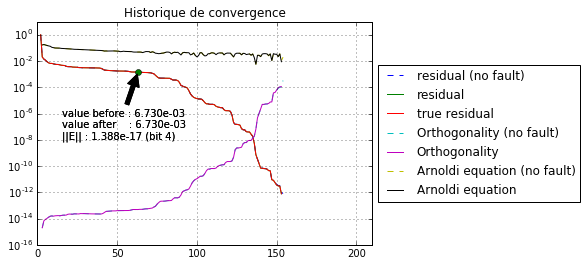

animation


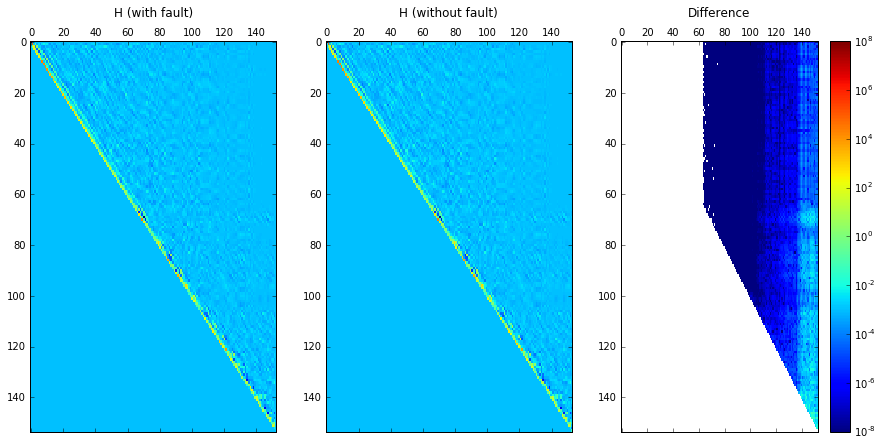

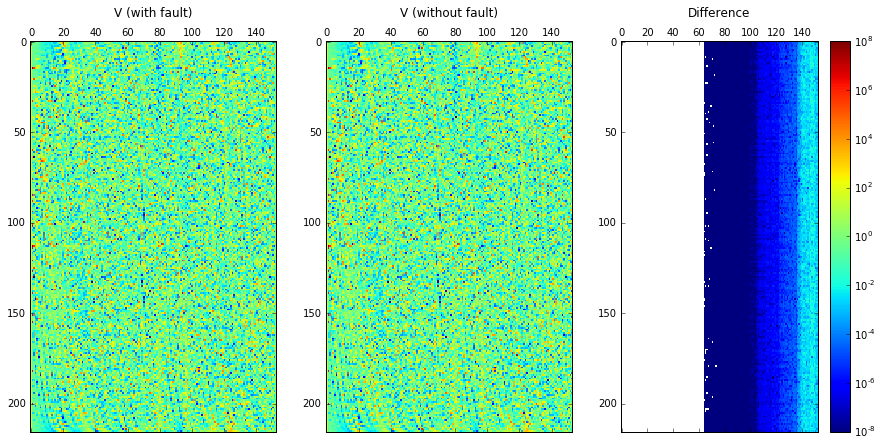

{'register_before': 0.25, 'loc': {'i': 86, 'k': 73, 'j': 0}, 'value_before': 0.0066842250286970198, 'register': 'left', 'timer': 63, 'register_after': 0.2500000000000009, 'bit': 4, 'value_after': 0.0066842250286970059, 'check': True}


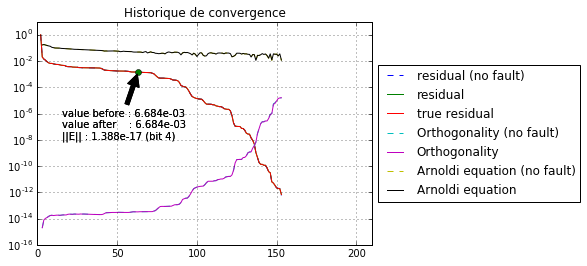

animation


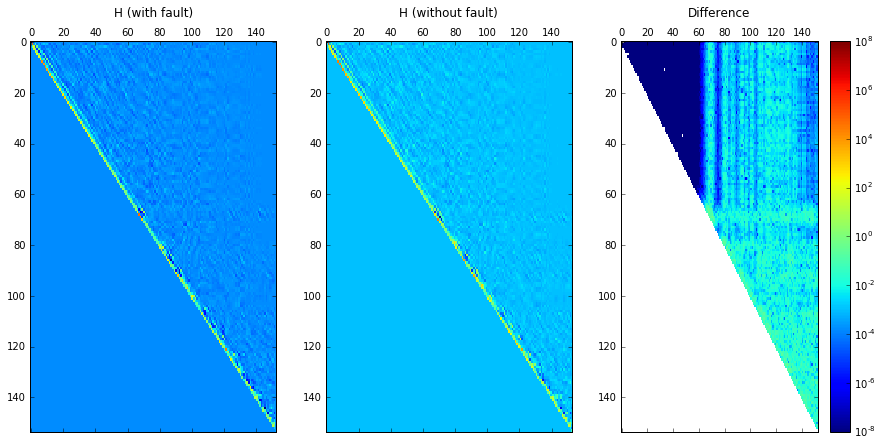

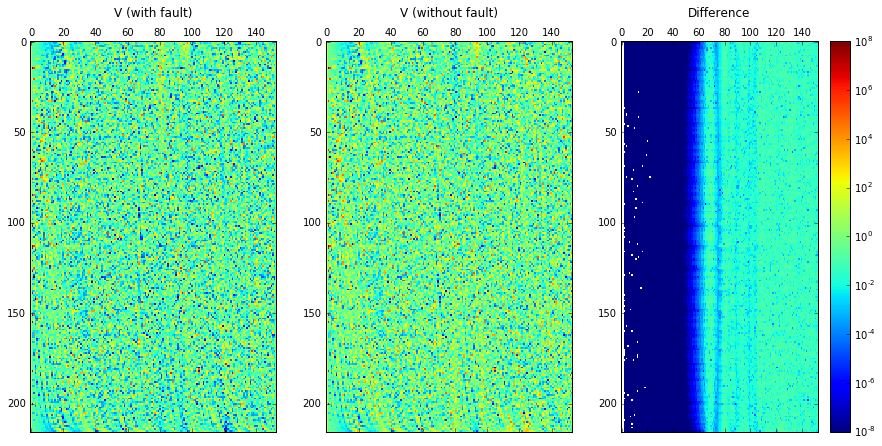

{'register_before': 0.25, 'loc': {'i': 20, 'k': 41, 'j': 0}, 'value_before': -0.016086365255967894, 'register': 'left', 'timer': 8, 'register_after': 5.820766091346741e-11, 'bit': 57, 'value_after': -0.014730553093534292, 'check': None}


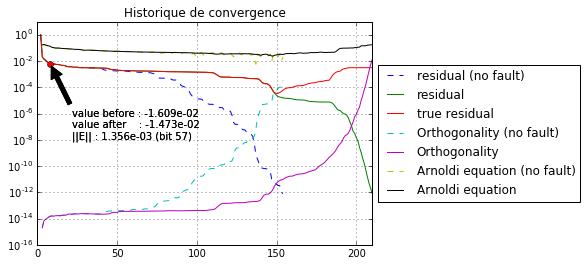

animation


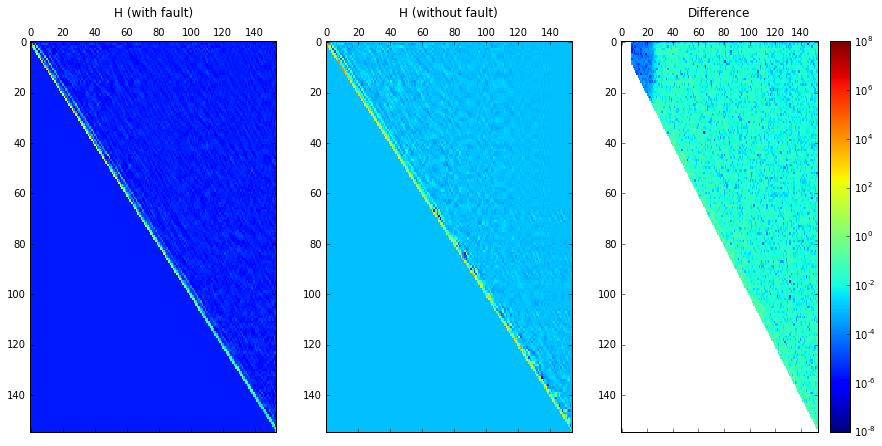

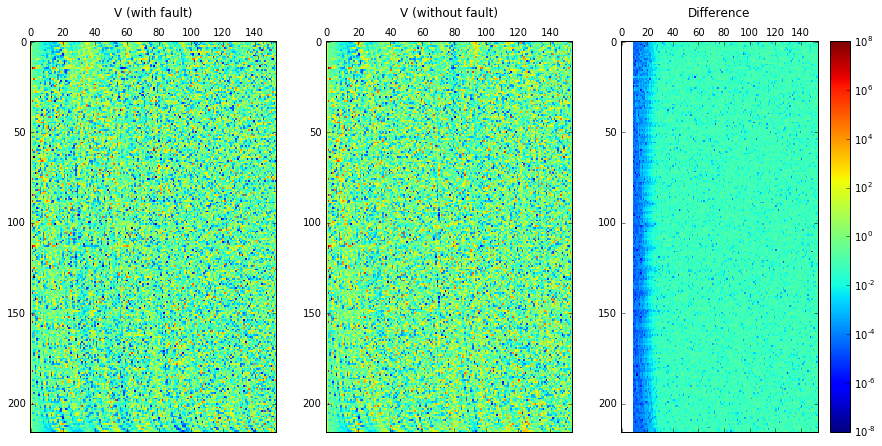

{'register_before': 0.25, 'loc': {'i': 20, 'k': 41, 'j': 0}, 'value_before': -0.016086365255967829, 'register': 'left', 'timer': 8, 'register_after': 5.820766091346741e-11, 'bit': 57, 'value_after': -0.014730553093534262, 'check': None}


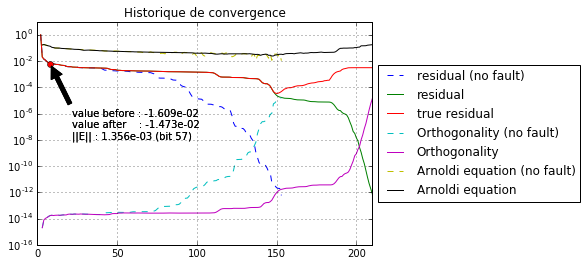

animation


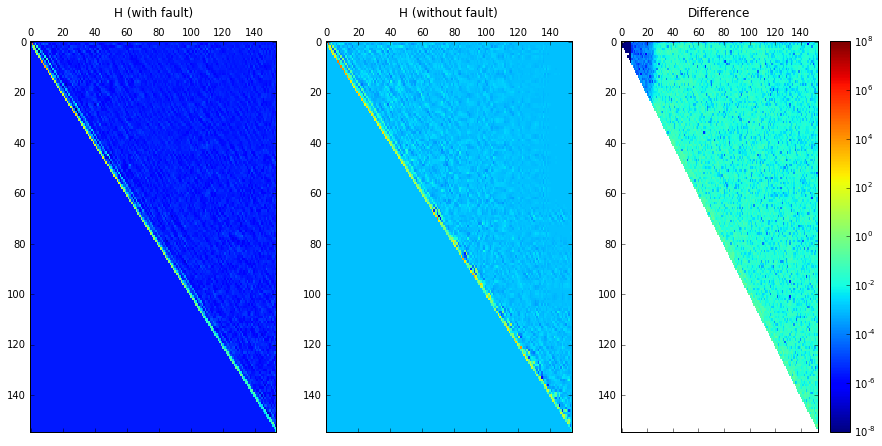

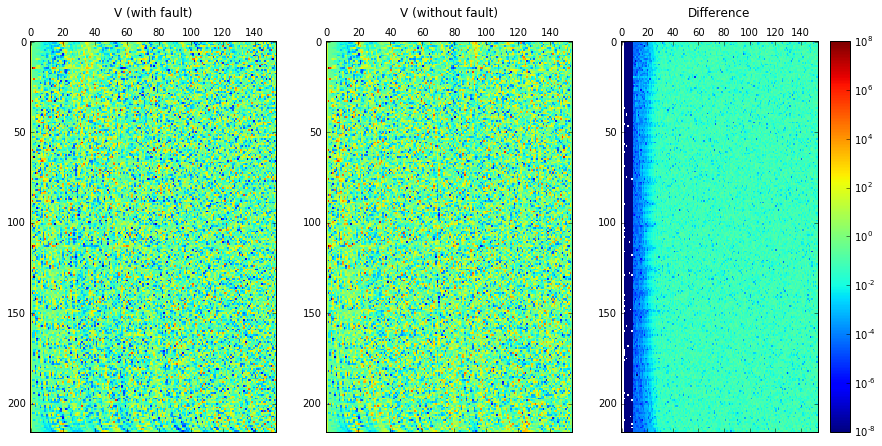

In [40]:
%matplotlib inline

if True:
    
    data = filter(lambda d: len(d["faults"]) > 0, E.get_data())
    data = filter(lambda d: len(d["faults"]) > 0, E.get_data())
    
    data_faults = map(lambda d: d["faults"], data)
    data_faults = map(lambda d: d["faults"], data)
    
    data_H = map(lambda d: d["H"], data)
    data_V = map(lambda d: d["V"], data)
    data_orthogonality = map(lambda d: d["orthogonality"], data)
    data_arnoldi = map(lambda d: d["arnoldi"], data)
    #data_V_ = map(lambda d: d["V_"], data)
    data_iteration = map(lambda d: d["iteration_count"], data)
    data_errors = map(lambda d: d["residuals"], data)
    data_true_errors = map(lambda d: d["true_residuals"], data)
    data_errors_ = map(lambda d: d["residuals"], data)
    data_true_errors_ = map(lambda d: d["true_residuals"], data)
    

        

    for i in xrange(len(data_faults)):
        X = np.arange(2, data_iteration[i]+1)
        Y = data_errors[i]
        Z = data_true_errors[i]
        O = data_orthogonality[i]
        A = data_arnoldi[i]
        
        XT = np.arange(2, F.get_data('iteration_count')[i%len(orthMethods)]+1)
        YT = F.get_data('residuals')[i%len(orthMethods)]
        ZT = F.get_data('true_residuals')[i%len(orthMethods)]
        OT = F.get_data('orthogonality')[i%len(orthMethods)]
        AT = F.get_data('arnoldi')[i%len(orthMethods)]
    
        xlim = [0, 210]
        ylim = [1.e-16, 1.e+1]
        plot_2D(XT, YT, log=True, title='Historique de convergence', label = "residual (no fault)", linestyle='--', xlim=xlim, ylim=ylim)  
        
        
        plot_2D(X, Y, log=True, title='Historique de convergence', label = "residual", xlim=xlim, ylim=ylim)
        plot_2D(X, Z, log=True, title='Historique de convergence', label = "true residual", xlim=xlim, ylim=ylim)
        
        plot_2D(XT, OT, log=True, title='Historique de convergence', label = "Orthogonality (no fault)", linestyle='--', xlim=xlim, ylim=ylim)  
        plot_2D(X, O, log=True, title='Historique de convergence', label = "Orthogonality", xlim=xlim, ylim=ylim)
  
        plot_2D(XT, AT, log=True, title='Historique de convergence', label = "Arnoldi equation (no fault)", linestyle='--', xlim=xlim, ylim=ylim)  
        plot_2D(X, A, log=True, title='Historique de convergence', label = "Arnoldi equation", xlim=xlim, ylim=ylim)
 

        x = (data_faults[i][0]['timer'])
        y = data_true_errors[i][x]
        y_ = data_true_errors_[i][x]
        print data_faults[i][0]
        if data_faults[i][0]["check"]:
            c = "green"
        elif data_faults[i][0]["check"] == False:
            c = "yellow"
        else:
            c = "red"
        plt.plot([x], [y], 'ro', c=c)
        #plt.plot([x], [y_], 'ro', c="green" if data_faults[i][0]["check"] else "red")
        annotation = "value before : %.3e \nvalue after    : %.3e \n||E|| : %.3e (bit %d)" % (data_faults[i][0]['value_before'], 
                                                                                               data_faults[i][0]['value_after'], 
                                                                                               abs(data_faults[i][0]['value_before']-data_faults[i][0]['value_after']),
                                                                                               data_faults[i][0]['bit'])
        plt.annotate(annotation, xy=(x, y), xytext=(1. / 10. * data_iteration[i], 1.e-8),
                arrowprops=dict(facecolor='black', shrink=0.05),)
        plt.annotate(annotation, xy=(x, y_), xytext=(1. / 10. * data_iteration[i], 1.e-8),
                arrowprops=dict(facecolor='black', shrink=0.05),)
        plt.show()
        print "animation"
        if True:
            fig1 = plt.figure(figsize = [15,7])
    
            ax1 = fig1.add_subplot(131, autoscale_on=True, title = "H (with fault)")
            ax2 = fig1.add_subplot(132, autoscale_on=True, title = "H (without fault)")
            ax3 = fig1.add_subplot(133, autoscale_on=True, title = "Difference")
    
            fig2 = plt.figure(figsize = [15,7])
    
            ax4 = fig2.add_subplot(131, autoscale_on=True, title = "V (with fault)")
            ax5 = fig2.add_subplot(132, autoscale_on=True, title = "V (without fault)")
            ax6 = fig2.add_subplot(133, autoscale_on=True, title = "Difference")
            
            #fig3 = plt.figure(figsize = [15,7])
    
            #ax7 = fig3.add_subplot(131, autoscale_on=True, title = "V not orthogonalized (with fault)")
            #ax8 = fig3.add_subplot(132, autoscale_on=True, title = "V not orthogonalized (without fault)")
            #ax9 = fig3.add_subplot(133, autoscale_on=True, title = "Difference")
    
    
            iteration = min(F.get_data("iteration_count")[0], data_iteration[i])
    
            ax1.matshow(data_H[i][:iteration+1,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            ax2.matshow(F.get_data("H")[0][:iteration+1,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            cax3 = ax3.matshow(abs(data_H[i][:iteration+1, :iteration]-F.get_data("H")[0][:iteration+1, :iteration])[:iteration+1,:iteration], aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
    
            ax4.matshow(data_V[i][:,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            ax5.matshow((F.get_data("V")[0])[:,:iteration], aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            cax6 = ax6.matshow(abs(data_V[i][:, :iteration]-F.get_data("V")[0][:, :iteration])[:,:iteration], aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8),  cmap=plt.get_cmap('jet'))
    
            #ax7.matshow(data_V_[i][:,:iteration]._data, aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            #ax8.matshow((F.get_data("V_")[0])[:,:iteration]._data, aspect='auto',origin='upper', cmap=plt.get_cmap('jet'))
            #cax9 = ax9.matshow(abs(data_V_[i]-F.get_data("V_")[0])[:,:iteration]._data, aspect='auto',origin='upper', norm=LogNorm(vmin=1.e-8, vmax= 1.e+8), cmap=plt.get_cmap('jet'))
    

            fig1.colorbar(cax3)
            fig2.colorbar(cax6)
            #fig3.colorbar(cax9)
        plt.show()